# Using BERTopic for topic modelling 

In [2]:
import re
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

In [3]:
# Step 1: Extract and preprocess documents
documents = []
for i in range(475):  # Your 475 files
    file_path = f"../corpus/program{i}.txt"
    with open(file_path, 'r') as file:
        content = file.read()
        # Extract content between DOC tags
        docs = re.findall(r'<DOC>(.*?)</DOC>', content, re.DOTALL)
        documents.extend(docs)


In [8]:
# Step 2: Configure BERTopic
# Remove stopwords after embedding to preserve context
vectorizer_model = CountVectorizer(stop_words="english", min_df=10, ngram_range=(1,2))

# Step 3: Create and train the model
topic_model = BERTopic(
    vectorizer_model=vectorizer_model,
    min_topic_size=40,  # Adjust based on your needs
    low_memory=True,    # For memory efficiency
    calculate_probabilities=False  # For speed and memory efficiency
)

# Step 4: Fit the model
topics, probs = topic_model.fit_transform(documents)


In [19]:
len(documents)

12614

In [9]:
from gensim.models import CoherenceModel
from gensim import corpora

# Example: Assuming `topic_model` is the trained BERTopic model and `documents` is the list of your original documents

# Retrieve topics and their top words
topics = topic_model.get_topics()

# Extract the list of top words for each topic
topics_words = []
for topic_num, words in topics.items():
    if topic_num == -1:
        continue
    words = [word for word, _ in words]
    topics_words.append(words)

# Preprocess documents (ensure they are tokenized and in the right format for CoherenceModel)
texts = [[word for word in doc.split()] for doc in documents]  # Assuming basic tokenization here

# Create a dictionary and corpus from the documents
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Compute coherence score
coherence_model = CoherenceModel(topics=topics_words, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print(f"Coherence Score: {coherence_score}")


Coherence Score: 0.6109209552023138


In [6]:
# topic_model.save("bertopic_module")
topic_model = BERTopic.load("bertopic_min_top_50_2gram")

In [17]:
df=topic_model.get_topic_freq()
df["Count"][50:]

1     66
31    62
13    61
58    61
56    59
6     58
38    57
61    55
50    54
30    54
60    53
48    51
49    50
4     50
42    50
45    50
34    49
19    48
65    44
66    44
35    43
71    41
Name: Count, dtype: int64

In [18]:
# Create an interactive visualization of topics
fig = topic_model.visualize_topics()

# To save the visualization as HTML
fig.write_html("visualise_topics_more.html")

In [22]:
topic_model.visualize_distribution(probs, min_probability=0.05)

In [7]:
topic_model.visualize_barchart()

In [ ]:
fig = topic_model.visualize_documents(documents, hide_annotations=True)
fig.show()

In [21]:
fig = topic_model.visualize_documents(documents, topics=[0,1,2,4,6,8,12,14,16,18,20,25,29,32,36,41,42,52])
fig.show()

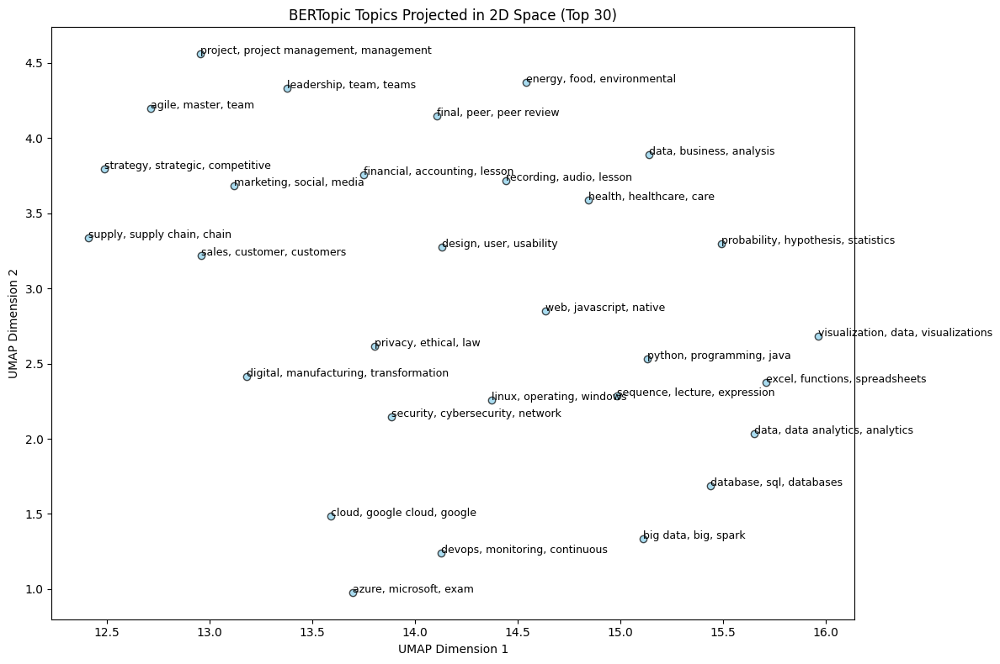

In [16]:
from umap import UMAP
import matplotlib.pyplot as plt
from bertopic import BERTopic

# Load BERTopic model
model = BERTopic.load("bertopic_module")

# Step 1: Get topic info and filter out outliers (-1)
topic_info = model.get_topic_info()
filtered_topics = topic_info[topic_info['Topic'] != -1]

# Step 2: Get top N topics by size
top_n = 30
top_topics = filtered_topics.nlargest(top_n, 'Count')['Topic'].values

# Step 3: Get vectors and generate labels
topic_vectors = model.topic_embeddings_[top_topics]  # Requires calculate_topic_embeddings()
topic_labels = model.generate_topic_labels(
    nr_words=3,
    separator=", ",
    topic_prefix=False
)[:top_n]

# Step 4: UMAP projection
umap_model = UMAP(n_components=2, random_state=42)
coords = umap_model.fit_transform(topic_vectors)

# Step 5: Plot
plt.figure(figsize=(12, 8))
plt.scatter(coords[:, 0], coords[:, 1], c='skyblue', edgecolors='k', alpha=0.7)

for i, label in enumerate(topic_labels):
    plt.text(coords[i, 0], coords[i, 1], label, fontsize=9)

plt.title("BERTopic Topics Projected in 2D Space (Top 30)")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.tight_layout()
plt.show()


In [19]:
topic_model.visualize_hierarchy("bottom")

In [26]:
topic_model.visualize_heatmap()

In [ ]:
hierarchical_topics = topic_model.hierarchical_topics(documents)


100%|██████████| 56/56 [00:00<00:00, 117.51it/s]


In [55]:
fig2 = topic_model.visualize_hierarchical_documents(documents, hierarchical_topics)
fig2.write_html("topics_visualization.html")

In [57]:
fig2.write_html("doc.html")